# Imports

In [1]:
import sys
sys.path.append('/media/analysis-code/figurefirst/')

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg' #svg
import pylab as plb # this notebook is for plotting
import numpy as np
import scipy as sp
import flylib as flb
import group_data as gd
import cPickle
plb.rcParams['pdf.fonttype'] = 42 #allows text in saved .pdf files to be edited in illustrator
plb.rcParams['font.size'] = 7 #
plb.rcParams['font.stretch'] =  0
plb.rcParams['image.interpolation'] = 'Nearest'
plb.rcParams['image.cmap'] = 'BrBG'
import warnings
warnings.filterwarnings('ignore')
import figurefirst as fifi

In [3]:
#store the selected filter setting in a dictionary. Pickle for later use
#import cPickle
#with open('chosen_fiter_settings.cpkl','wb') as f:
#    cPickle.dump(chosen_settings,f)
#with open('chosen_filter_settings.cpkl','rb') as f:
#    chosen_settings = cPickle.load(f)

# Load data

In [4]:
import h5py
mtd_22H05_pr = h5py.File('../07_process_rotational_panel_cohorts/open_loop_rotation_22H05_ptch_roll.hdf5','r')
mtd_39E01_pr = h5py.File('../07_process_rotational_panel_cohorts/open_loop_rotation_39E01_ptch_roll.hdf5','r')

# Saccade Functions

In [5]:
trial_names_22H05 = np.array(mtd_22H05_pr['selected_signals']['trial_names'])
def get_selection_mtrx_22H05(signal,trial,mask = None):
    selection = trial_names_22H05 == trial
    if not(mask is None):
        selection = selection & mask
        if np.sum(selection) == 0:
            return np.nan
    selection = np.squeeze(np.argwhere(selection))
    if signal == 'Sac':
        return sac_data[selection,:]
    elif signal in ['Ph0','Ph1','Ph2','wb_frequency']:
        return np.array(mtd_22H05_pr['normed_signals'][signal])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms'][signal])[selection][:,None]
    elif signal in ['lpr']:
        lw = np.array(mtd_22H05_pr['normed_signals']['Ph0'])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms']['Ph0'])[selection][:,None]
        rw = np.array(mtd_22H05_pr['normed_signals']['Ph1'])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms']['Ph1'])[selection][:,None]
        return lw+rw
    else:
        return np.array(mtd_22H05_pr['normed_signals'][signal])[selection,:]

In [6]:
trial_names_39E01 = np.array(mtd_39E01_pr['selected_signals']['trial_names'])
def get_selection_mtrx_39E01(signal,trial,mask = None):
    selection = trial_names_39E01 == trial
    if not(mask is None):
        selection = selection & mask
        if np.sum(selection) == 0:
            return np.nan
    selection = np.squeeze(np.argwhere(selection))
    if signal == 'Sac':
        return sac_data[selection,:]
    elif signal in ['Ph0','Ph1','Ph2','wb_frequency']:
        return np.array(mtd_39E01_pr['normed_signals'][signal])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms'][signal])[selection][:,None]
    elif signal in ['lpr']:
        lw = np.array(mtd_39E01_pr['normed_signals']['Ph0'])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms']['Ph0'])[selection][:,None]
        rw = np.array(mtd_39E01_pr['normed_signals']['Ph1'])[selection,:]*np.array(
                mtd_39E01_pr['signal_norms']['Ph1'])[selection][:,None]
        return lw+rw
    else:
        return np.array(mtd_39E01_pr['normed_signals'][signal])[selection,:]

In [7]:
saccade_tables_39E01 = h5py.File('../07_process_rotational_panel_cohorts/detected_saccades_nl_39E01.hdf5','r')
saccade_tables_22H05 = h5py.File('../07_process_rotational_panel_cohorts/detected_saccades_nl_22H05.hdf5','r')

In [8]:
lw_natural_22H05 = gd.signal_plot_info['Ph0']['transform'](
                    (np.array(saccade_tables_22H05['Ph0'])* 
                      np.array(saccade_tables_22H05['lwing_norm'])[:,None]) + \
                        np.array(saccade_tables_22H05['lwing_mean'])[:,None])
    
rw_natural_22H05 = gd.signal_plot_info['Ph1']['transform'](
                    (np.array(saccade_tables_22H05['Ph1'])* 
                      np.array(saccade_tables_22H05['rwing_norm'])[:,None]) + \
                        np.array(saccade_tables_22H05['rwing_mean'])[:,None])
    
lmr_natural_22H05 = gd.signal_plot_info['Ph2']['transform'](
                    (np.array(saccade_tables_22H05['Ph2'])* 
                      np.array(saccade_tables_22H05['lmr_norms'])[:,None]) + \
                        np.array(saccade_tables_22H05['lmr_mean'])[:,None])
    

lw_natural_39E01 = gd.signal_plot_info['Ph0']['transform'](
                    (np.array(saccade_tables_39E01['Ph0'])* 
                      np.array(saccade_tables_39E01['lwing_norm'])[:,None]) + \
                        np.array(saccade_tables_39E01['lwing_mean'])[:,None])
    
rw_natural_39E01 = gd.signal_plot_info['Ph1']['transform'](
                    (np.array(saccade_tables_39E01['Ph1'])* 
                      np.array(saccade_tables_39E01['rwing_norm'])[:,None]) + \
                        np.array(saccade_tables_39E01['rwing_mean'])[:,None])
    
lmr_natural_39E01 = gd.signal_plot_info['Ph2']['transform'](
                    (np.array(saccade_tables_39E01['Ph2'])* 
                      np.array(saccade_tables_39E01['lmr_norms'])[:,None]) + \
                        np.array(saccade_tables_39E01['lmr_mean'])[:,None])

sort_sig_22H05 = np.mean(lmr_natural_22H05[:,49:51],axis = 1) - np.mean(lmr_natural_22H05[:,:30],axis = 1)
sort_sig_39E01 = np.mean(lmr_natural_39E01[:,49:51],axis = 1) - np.mean(lmr_natural_39E01[:,:30],axis = 1)

sort_idx_22H05 = np.argsort(sort_sig_22H05,axis = 0)
sort_idx_39E01 = np.argsort(sort_sig_39E01,axis = 0)

In [9]:
#create dict of sorted trials in memory
sorted_saccades_22H05 = dict()
[sorted_saccades_22H05.update({sig:np.array(saccade_tables_22H05[sig])[sort_idx_22H05]}) for 
                                                sig in saccade_tables_22H05.keys()];

In [10]:
percentile_ranges_22H05 = np.linspace(0,np.shape(sorted_saccades_22H05['Ph2'])[0],100).astype(int)[::-1]
decile_brackets_22H05 = zip(percentile_ranges_22H05[9:110:10],percentile_ranges_22H05[0:100:10])

In [11]:
def get_sac_hist(trial):
    xi = gd.get_xio(trial)
    decile = 0
    histdata = dict()
    for top_start,top_stop in decile_brackets_22H05:
        top_mask = (np.arange(len(sorted_saccades_22H05['peak']))<top_stop) & \
                    (np.arange(len(sorted_saccades_22H05['peak']))>top_start)
        selection_rows = np.squeeze(np.argwhere(trial_names_22H05 == trial))
        selection_mask = np.any([sorted_saccades_22H05['row'] == x for x in selection_rows],axis = 0)
        down_samp_mask = np.zeros_like(selection_mask)
        rowcount = 0
        #for i,rownum in enumerate(selection_rows):
        #    if i in down_samp_idx:
        #        down_samp_mask += sorted_saccades_22H05['row'] == rownum
        #        raster_rows[sorted_saccades_22H05['row'] == rownum] = rowcount
        #        rowcount += 1
        #clvl = decile/10.0

        #for rw,cl in zip(raster_rows[top_mask & selection_mask & down_samp_mask],
        #                 sorted_saccades_22H05['peak'][top_mask & selection_mask & down_samp_mask]):
        #    sac_raster[rw,cl-10:cl+10] = clvl-0.5
        bins = np.arange(xi[0],xi[-1],1)
        vals,bins = np.histogram(xi[sorted_saccades_22H05['peak'][top_mask & selection_mask]],bins = bins)
        histdata[decile] = (vals,bins)
        decile +=1
    leftward_hist = np.sum([histdata[d][0] for d in range(5)],axis =0) / float(len(selection_rows))
    rightward_hist = np.sum([histdata[d][0] for d in range(5,10)],axis = 0) / float(len(selection_rows))
    leftward_top_hist = histdata[0][0]
    rightward_top_hist = histdata[9][0]
    total_hist = np.sum([histdata[d][0] for d in range(10)],axis = 0)

    edges = histdata[0][1]
    lower_bins = np.resize(edges,len(edges)-1)
    tmid = lower_bins + 0.5*np.diff(edges)
    return {'x': tmid,
            'l':leftward_hist,
            'r':rightward_hist,
            'lt':leftward_top_hist,
            'rt':rightward_top_hist}


def get_sac_mtrx(trial):
    xi = gd.get_xio(trial)
    #sac_raster = np.zeros((sub_samples,len(xi)))
    decile = 0
    histdata = dict()
    for top_start,top_stop in decile_brackets_22H05:
        top_mask = (np.arange(len(sorted_saccades_22H05['peak']))<top_stop) & \
                    (np.arange(len(sorted_saccades_22H05['peak']))>top_start)
        selection_rows = np.squeeze(np.argwhere(trial_names_22H05 == trial))
        #down_samp_idx = np.linspace(2,len(selection_rows)-2,sub_samples).astype(int)
        selection_mask = np.any([sorted_saccades_22H05['row'] == x for x in selection_rows],axis = 0)
        #down_samp_mask = np.zeros_like(selection_mask)
        #raster_rows = np.empty_like(selection_mask).astype(int)
        #raster_rows[:] = np.nan
        #rowcount = 0
        #for i,rownum in enumerate(selection_rows):
        #    if i in down_samp_idx:
        #        down_samp_mask += sorted_saccades_22H05['row'] == rownum
        #        raster_rows[sorted_saccades_22H05['row'] == rownum] = rowcount
        #        rowcount += 1
        #clvl = decile/10.0

        #for rw,cl in zip(raster_rows[top_mask & selection_mask & down_samp_mask],
        #                 sorted_saccades_22H05['peak'][top_mask & selection_mask & down_samp_mask]):
        #    sac_raster[rw,cl-10:cl+10] = clvl-0.5
        bins = np.arange(xi[0],xi[-1],1)
        vals,bins = np.histogram(xi[sorted_saccades_22H05['peak'][top_mask & selection_mask]],bins = bins)
        histdata[decile] = (vals,bins)
        decile +=1

    leftward_hist = np.sum([histdata[d][0] for d in range(5)],axis =0)
    rightward_hist = np.sum([histdata[d][0] for d in range(5,10)],axis = 0)
    leftward_top_hist = histdata[0][0]
    rightward_top_hist = histdata[9][0]
    total_hist = np.sum([histdata[d][0] for d in range(10)],axis = 0)

    edges = histdata[0][1]
    lower_bins = np.resize(edges,len(edges)-1)
    tmid = lower_bins + 0.5*np.diff(edges)
    return leftward_hist,rightward_hist,leftward_top_hist,rightward_top_hist
    #plb.imshow(sac_raster,vmin = -1,vmax =1,extent = (xi[0],xi[-1],0,1.5),aspect = 'auto')
    #plb.plot(tmid,total_hist/np.float(np.shape(selection_rows)[0]),color = 'k')

In [12]:
# remap directions to the 'fly-forward' plotting coordinates for pitch roll
flow_lbls = [270,240,210,180,150,120,90,60,30,0,330,300]
remap_vals = np.arange(-180,180,30)
pr_map = {}
[pr_map.update({rmval:'pth_roll_%s'%(fllbl)}) for fllbl,rmval in zip (flow_lbls,remap_vals)]

# remap directions to the 'fly-forward' plotting coordinates for yaw roll
flow_lbls = [0,30,60,90,120,150,180,210,240,270,300,330]
remap_vals = np.arange(-180,180,30)
yr_map = {}
[yr_map.update({rmval:'step_roll_yaw_%03d'%(fllbl)}) for fllbl,rmval in zip (flow_lbls,remap_vals)]

[None, None, None, None, None, None, None, None, None, None, None, None]

[[<matplotlib.lines.Line2D at 0x7f80704b3450>],

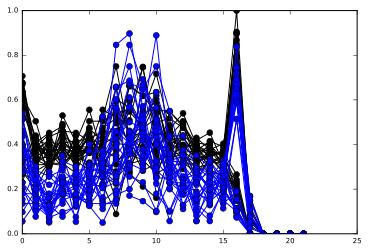

In [13]:
[plb.plot(get_sac_hist(pr_map[k])['l'],'-o',color = 'k') for k in range(-180,180,30)]
[plb.plot(get_sac_hist(pr_map[k])['r'],'-o',color = 'k') for k in range(-180,180,30)]
[plb.plot(get_sac_hist(yr_map[k])['r'],'-o',color = 'b') for k in range(-180,180,30)]
[plb.plot(get_sac_hist(yr_map[k])['l'],'-o',color = 'b') for k in range(-180,180,30)]

In [14]:
def filter_mtrx_linear(lmr_mtrx,lc,hc):
    """fiter left-right data using a bandpass filter"""
    return np.apply_along_axis(flb.butter_bandpass_filter,1,lmr_mtrx,lc,hc,0.021)

def filter_mtrx_nonlinear(lmr_mtrx,kernel_size=12,mysize=21):
    """filter using a median filter followed by wiener filter"""
    from scipy import signal
    trenddata = np.apply_along_axis(signal.medfilt,1,lmr_mtrx,kernel_size = kernel_size)
    detrend = lmr_mtrx-trenddata
    detrend[np.isnan(detrend)] = 0
    return np.apply_along_axis(signal.wiener,1,detrend,mysize =mysize)
    
def detect_saccades(lmr_mtrx,p0=0.5,p1=2,thresh=0.2,linear = True):
    """filter data then detect saccades over some threshold"""
    if linear:
        sac_band = filter_mtrx_linear(lmr_mtrx,p0,p1)
    else:
        sac_band = filter_mtrx_nonlinear(lmr_mtrx,p0,p1)
    event_lists = [flb.idx_by_thresh(sweep,thresh) for sweep in abs(sac_band)]
    event_lists = [[event for event in event_list if 
                    (len(event)>0) and not(event is None)] for event_list in event_lists if event_list]
    return event_lists,sac_band

def convert_events_to_mtrx(event_lists,output_shape,scalings = 1):
    """loop through the detected events to create a matrix of binary
    classified samples - output shape should match the dimensions matrix
    of wingstroke data that was input to the detect_saccades function"""
    event_mtrx = np.zeros(output_shape)
    if type(scalings) is list:
        for i,(elist,slist) in enumerate(zip(event_lists,scalings)):
            for event,scailing in zip(elist,slist):
                event_mtrx[i,event] = scailing
        return event_mtrx
    for i,elist in enumerate(event_lists):
        for event in elist:
            event_mtrx[i,event] = scalings
    return (event_mtrx > 0)

def get_putative_saccade_mtrx(p0,p1,thresh,linear = True):
    """apply detect_saccades and then convert to matrix use to evaluate true positive
    and false positive rates"""
    putative_saccades = detect_saccades(ground_truth_lmr,p0,p1,thresh,linear)
    putative_saccade_mtrx = convert_events_to_mtrx(putative_saccades[0],np.shape(ground_truth_lmr))
    return (putative_saccade_mtrx > 0)

# Plotting params

In [15]:
#trial_names_39E01 = np.array(mtd_39E01_pr['selected_signals']['trial_names'])
fly_numbers_22H05 = set(mtd_22H05_pr['selected_signals']['fly_numbers'])
fly_numbers_39E01 = set(mtd_39E01_pr['selected_signals']['fly_numbers'])
#fly_numbers_39E01 = gd.GMR39E01_pr_list[4:]#set(mtd_39E01_pr['selected_signals']['fly_numbers'])

In [16]:
import figurefirst as fifi
import plotfuncs as plf

In [17]:
import group_data as gd
xi = gd.get_xio('pth_roll_0')
tmask = (xi>-3) & (xi<10)

In [18]:
z_rng = {'Ph2':(-30,30),'Ph1':(-20,20),'sac':(-0.5,0.5),
         'b1':(-3,3),'b2':(-3,3),'b3':(-3,3),
         'i1':(-3,3),'i2':(-3,3),'iii3':(-3,3),'iii1':(-3,3),'iii24':(-3,3),
         'hg1':(-3,3),'hg2':(-3,3),'hg3':(-3,3),'hg4':(-3,3)}

y_bounds = {'Ph2':(-20,20),'Ph1':(-20,20),'Ph0':(-20,20),'sac':(0,1),'wb_frequency':(-10,10),'lpr':(-20,20),
            'b1':(-2,2),'b2':(-2,2),'b3':(-2,2),'i1':(-2,2),
            'i2':(-2,2),'iii3':(-2,2),'iii1':(-2,2),'iii24':(-3,3),
            'hg1':(-2,2),'hg2':(-2,2),'hg3':(-2,2),'hg4':(-2,2)}
bsln = (xi>-3) & (xi<0)

# Tuning Curves

## Convenience functions
Extract datasets based on stimulus condition

In [19]:
# remap directions to the 'fly-forward' plotting coordinates for pitch roll
flow_lbls = [270,240,210,180,150,120,90,60,30,0,330,300]
remap_vals = np.arange(-180,180,30)
pr_map = {}
[pr_map.update({rmval:'pth_roll_%s'%(fllbl)}) for fllbl,rmval in zip (flow_lbls,remap_vals)]

# remap directions to the 'fly-forward' plotting coordinates for yaw roll
flow_lbls = [0,30,60,90,120,150,180,210,240,270,300,330]
remap_vals = np.arange(-180,180,30)
yr_map = {}
[yr_map.update({rmval:'step_roll_yaw_%03d'%(fllbl)}) for fllbl,rmval in zip (flow_lbls,remap_vals)]

trial_names_22H05 = np.array(mtd_22H05_pr['selected_signals']['trial_names'])
trial_names_39E01 = np.array(mtd_39E01_pr['selected_signals']['trial_names'])

def get_selection_mtrx_22H05(signal,trial,mask = None):
    selection = trial_names_22H05 == trial
    if not(mask is None):
        selection = selection & mask
        if np.sum(selection) == 0:
            return np.nan
    selection = np.squeeze(np.argwhere(selection))
    if signal == 'Sac':
        return sac_data[selection,:]
    elif signal in ['Ph0','Ph1','Ph2','wb_frequency']:
        return np.array(mtd_22H05_pr['normed_signals'][signal])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms'][signal])[selection][:,None]
    elif signal in ['lpr']:
        lw = np.array(mtd_22H05_pr['normed_signals']['Ph0'])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms']['Ph0'])[selection][:,None]
        rw = np.array(mtd_22H05_pr['normed_signals']['Ph1'])[selection,:]*np.array(
                mtd_22H05_pr['signal_norms']['Ph1'])[selection][:,None]
        return lw+rw
    else:
        return np.array(mtd_22H05_pr['normed_signals'][signal])[selection,:]
    
def get_selection_mtrx_39E01(signal,trial,mask = None):
    selection = trial_names_39E01 == trial
    if not(mask is None):
        selection = selection & mask
        if np.sum(selection) == 0:
            return np.nan
    selection = np.squeeze(np.argwhere(selection))
    if signal == 'Sac':
        return sac_data[selection,:]
    elif signal in ['Ph0','Ph1','Ph2','wb_frequency']:
        return np.array(mtd_39E01_pr['normed_signals'][signal])[selection,:]*np.array(
                mtd_39E01_pr['signal_norms'][signal])[selection][:,None]
    elif signal in ['lpr']:
        lw = np.array(mtd_39E01_pr['normed_signals']['Ph0'])[selection,:]*np.array(
                mtd_39E01_pr['signal_norms']['Ph0'])[selection][:,None]
        rw = np.array(mtd_39E01_pr['normed_signals']['Ph1'])[selection,:]*np.array(
                mtd_39E01_pr['signal_norms']['Ph1'])[selection][:,None]
        return lw+rw
    else:
        return np.array(mtd_39E01_pr['normed_signals'][signal])[selection,:]
    
def get_curve_22H05(skey,stimset = 'pr',mask = None):
    """generator to get the tuning curve of a stimulus set"""
    if stimset == 'pr':
        xi = gd.get_xio('pth_roll_0')
        for v in np.arange(-180,180,30):
            tkey = pr_map[v]
            data_selection = get_selection_mtrx_22H05(skey,tkey,mask)
            #print data_selection is np.nan
            if data_selection is np.nan:
                yield np.nan
            else:
                data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
                val = np.nanmean(data_selection[:,(xi>0) & (xi<6)])
                val = gd.signal_plot_info[skey]['transform'](val)
                yield val
    elif stimset == 'yr':
        xi = gd.get_xio('step_roll_yaw_000')
        for v in np.arange(-180,180,30):
            tkey = yr_map[v]
            data_selection = get_selection_mtrx_22H05(skey,tkey,mask)
            if data_selection is np.nan:
                yield np.nan
            else:
                data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
                val = np.nanmean(data_selection[:,(xi>0) & (xi<6)])
                val = gd.signal_plot_info[skey]['transform'](val)
                yield val
            
def get_curve_39E01(skey,stimset = 'pr',mask = None):
    """generator to get the tuning curve of a stimulus set"""
    if stimset == 'pr':
        xi = gd.get_xio('pth_roll_0')
        for v in np.arange(-180,180,30):
            tkey = pr_map[v]
            data_selection = get_selection_mtrx_39E01(skey,tkey,mask)
            #print data_selection is np.nan
            if data_selection is np.nan:
                yield np.nan
            else:
                data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
                val = np.nanmean(data_selection[:,(xi>0) & (xi<6)])
                val = gd.signal_plot_info[skey]['transform'](val)
                yield val
    elif stimset == 'yr':
        xi = gd.get_xio('step_roll_yaw_000')
        for v in np.arange(-180,180,30):
            tkey = yr_map[v]
            data_selection = get_selection_mtrx_39E01(skey,tkey,mask)
            if data_selection is np.nan:
                yield np.nan
            else:
                data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
                val = np.nanmean(data_selection[:,(xi>0) & (xi<6)])
                val = gd.signal_plot_info[skey]['transform'](val)
                yield val

## Calculate the tuning curves

### 22H05

In [10]:
# 22H05 tuning curves
pr_means_22H05 = dict()
yr_means_22H05 = dict()
# array of fly numbers
fnarr = np.array(mtd_22H05_pr['selected_signals']['fly_numbers'])
for skey in y_bounds.keys():
    if not(skey == 'sac'):
        pr_means_22H05[skey]  = [[v for v in get_curve_22H05(skey,'pr',mask = fnarr == fn)] for fn in fly_numbers_22H05]
        yr_means_22H05[skey] = [[v for v in get_curve_22H05(skey,'yr',mask = fnarr == fn)] for fn in fly_numbers_22H05]
mns_22H05 = {'pitch_roll':pr_means_22H05,'yaw_roll':yr_means_22H05}
with open('mns_22H05.cpkl','wb') as f:
    cPickle.dump(mns_22H05,f)

### 39E01

In [14]:
# 39E01 tuning curves
pr_means_39E01 = dict()
yr_means_39E01 = dict()
trimed = [fn for fn in list(fly_numbers_39E01) if not(fn == 987)]
# array of fly numbers
fnarr = np.array(mtd_39E01_pr['selected_signals']['fly_numbers'])
for skey in y_bounds.keys():
    if not(skey == 'sac'):
        pr_means_39E01[skey]  = [[v for v in get_curve_39E01(skey,'pr',mask = fnarr == fn)] for fn in trimed]
        yr_means_39E01[skey] = [[v for v in get_curve_39E01(skey,'yr',mask = fnarr == fn)] for fn in trimed]
mns_39E01 = {'pitch_roll':pr_means_39E01,'yaw_roll':yr_means_39E01}
with open('mns_39E01.cpkl','wb') as f:
    cPickle.dump(mns_39E01,f)

## load the tuning curves

In [20]:
with open('mns_22H05.cpkl','rb') as f:
    mns_22H05 = cPickle.load(f)

with open('mns_39E01.cpkl','rb') as f:
    mns_39E01 = cPickle.load(f)

In [75]:
np.sum(~np.isnan(mns_39E01['yaw_roll']['b1']),axis = 0)

array([12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12])

## Calculate tuning curve stats
Calculate confidence interval around tuning curve
means

In [15]:
def tc_stats(dta):
    """resampling for tuning curves"""
    resamps = list()
    for rep in range(500):
        selection_ints = np.random.random_integers(0,np.shape(dta)[0]-1,np.shape(dta)[0])
        resamps.append(np.nanmean(dta[selection_ints,:],axis = 0))
    ub = np.nanpercentile(np.array(resamps),97.5,axis = 0)
    lb = np.nanpercentile(np.array(resamps),2.5,axis = 0)
    mn = np.nanmean(dta,axis = 0)
    return {'ub':ub,'lb':lb,'mn':mn}

In [16]:
tc_summary_22H05 = dict()
for cohort_key,cohort in mns_22H05.items():
    cohort_dict = dict()
    for sig_key,sig_group in cohort.items():
        dta = np.array(sig_group)
        cohort_dict[sig_key] = tc_stats(dta)
    tc_summary_22H05[cohort_key] = cohort_dict
    
tc_summary_39E01 = dict()
for cohort_key,cohort in mns_39E01.items():
    cohort_dict = dict()
    for sig_key,sig_group in cohort.items():
        dta = np.array(sig_group)
        cohort_dict[sig_key] = tc_stats(dta)

    tc_summary_39E01[cohort_key] = cohort_dict

In [373]:
with open('tc_summary_22H05.cpkl','wb') as f:
    cPickle.dump(tc_summary_22H05,f)
    
with open('tc_summary_39E01.cpkl','wb') as f:
    cPickle.dump(tc_summary_39E01,f)

## load the tuning curve stats
confidence interval around tuning curve
means

In [21]:
with open('tc_summary_22H05.cpkl','rb') as f:
    tc_summary_22H05 = cPickle.load(f)
    
with open('tc_summary_39E01.cpkl','rb') as f:
    tc_summary_39E01 = cPickle.load(f)

## Calculate smoothed tuning curves

In [22]:
#this block defines the order of the fourier series
def fourier(p,x):
    """ return the fourier function for phase p and coefs x"""
#    return x[0] + \
#           x[1]*np.cos(1*p) + x[2]*np.sin(1*p)

    return x[0] + \
           x[1]*np.cos(1*p) + x[2]*np.sin(1*p) + \
           x[3]*np.cos(2*p) + x[4]*np.sin(2*p) + \
           x[5]*np.cos(3*p) + x[6]*np.sin(3*p) + \
           x[7]*np.cos(4*p) + x[8]*np.sin(4*p)
            
#def fourier(p,x):
#    """ return the fourier function for phase p and coefs x"""
#    return x[0] + \
#           x[1]*np.cos(1*p) + x[2]*np.sin(1*p) + \
#           x[3]*np.cos(2*p) + x[4]*np.sin(2*p) 
            


# projection matrix to linearize the fits to a fourier series
phases = [np.deg2rad(p) for p in range(-180,180,30)]
phases_resamp = [np.deg2rad(p) for p in range(-180,180,1)]

A = np.array([[1,
               np.cos(1*p),np.sin(1*p),
               np.cos(2*p),np.sin(2*p),
               np.cos(3*p),np.sin(3*p),
               np.cos(4*p),np.sin(4*p)] for p in phases]) #design matrix

#A = np.array([[1,
#               np.cos(1*p),np.sin(1*p),
#               np.cos(2*p),np.sin(2*p),] for p in phases]) #design matrix

#A = np.array([[1,
#               np.cos(1*p),np.sin(1*p)] for p in phases]) #design matrix


A_pinv = np.linalg.pinv(A)

coefs_22H05 = {'pitch_roll':{},'yaw_roll':{}}
for key in mns_22H05['pitch_roll'].keys():
    coeflist_22H05 = list()
    for curve in mns_22H05['pitch_roll'][key]:
        if np.sum(np.isfinite(curve)):
            coeflist_22H05.append(np.dot(A_pinv,curve))
    coefs_22H05['pitch_roll'][key] = coeflist_22H05
    coeflist_22H05 = list()
    for curve in mns_22H05['yaw_roll'][key]:
        if np.sum(np.isfinite(curve)):
            coeflist_22H05.append(np.dot(A_pinv,curve))
    coefs_22H05['yaw_roll'][key] = coeflist_22H05

coefs_39E01 = {'pitch_roll':{},'yaw_roll':{}}
for key in mns_39E01['pitch_roll'].keys():
    coeflist_39E01 = list()
    for curve in mns_39E01['pitch_roll'][key]:
        if np.sum(np.isfinite(curve)):
            coeflist_39E01.append(np.dot(A_pinv,curve))
    coefs_39E01['pitch_roll'][key] = coeflist_39E01
    coeflist_39E01 = list()
    for curve in mns_39E01['yaw_roll'][key]:
        if np.sum(np.isfinite(curve)):
            coeflist_39E01.append(np.dot(A_pinv,curve))
    coefs_39E01['yaw_roll'][key] = coeflist_39E01

## Tuning curve resampling
shuffle the phases to bootstrap the distribution of residuals

### Fitting function

In [ ]:
def p_from_coef(c):
    """get the peak of the curve given a set
    of coef c"""
    sf = np.array([fourier(p,c) for p in phases_resamp])
    return phases_resamp[np.argmax(sf)]

def get_tcs(phases,mns):
    """Get the tuning curve stats, fit the coefs using the 
    projection matrix A_pinv and then calculate the residuals
    from the function fourier. Return a list of residuals and
    coeficients, and fitted curves"""
    residuals_dict = {'pitch_roll':{},'yaw_roll':{}}
    fits_dict = {'pitch_roll':{},'yaw_roll':{}}
    curve_dict  = {'pitch_roll':{},'yaw_roll':{}}
    coef_dict = {'pitch_roll':{},'yaw_roll':{}}
    phase_dict = {'pitch_roll':{},'yaw_roll':{}}
    #p_from_coef = lambda c: phases_resamp
    for k1 in ['pitch_roll','yaw_roll']:
        for key in mns[k1].keys():
            residual_list = list()
            fit_list = list()
            curve_list = list()
            coef_list = list()
            phase_list = list()
            for curve in mns[k1][key]:
                if np.sum(np.isfinite(curve)):
                    coef = np.dot(A_pinv,curve)
                    fit = np.array([fourier(p,coef) for p in phases])
                    residuals = curve-fit
                    fit_list.append(fit)
                    residual_list.append(residuals)
                    curve_list.append(curve)
                    coef_list.append(coef)
                    phase_list.append(p_from_coef(coef))
            residuals_dict[k1][key] = residual_list
            fits_dict[k1][key] = fit_list
            curve_dict[k1][key] = curve_list
            coef_dict[k1][key] = coef_list
            phase_dict[k1][key] = phase_list
    return residuals_dict,fits_dict,curve_dict,coef_dict,phase_dict

### Fit the data for the two groups

In [29]:
residuals_22H05,fits_22H05,curves_22H05,coefs_22H05,phases_22H05 = get_tcs(phases,mns_22H05)
residuals_39E01,fits_39E01,curves_39E01,coefs_22H05,phases_39E01 = get_tcs(phases,mns_39E01)

In [28]:
def boot_ci(dta,n_rsamps = 1000):
    """bootstrap a confidence interval around the
    circular mean of a tuning curve"""
    from scipy.stats import circmean
    n = np.shape(dta)[0]
    mn = circmean(dta)
    meanlist = list()
    for rep in range(n_rsamps):
        idxs = np.random.choice(np.arange(n),n)
        meanlist.append(circmean(dta[idxs]))
    lb = np.percentile(meanlist,2.25)
    ub = np.percentile(meanlist,97.5)
    return mn,lb,ub

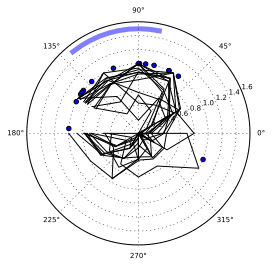

In [29]:
ax = plb.subplot(1,1,1,projection = 'polar')
sig = 'b1'
ax.scatter(phases_22H05['pitch_roll'][sig],np.ones_like(phases_22H05['pitch_roll'][sig]))
for c in fits_22H05['pitch_roll'][sig]:
    c = np.array(c)
    c = (c-np.min(c))/np.max(c-np.min(c))
    ax.plot(phases,c,color = 'k')
mn,ub,lb = boot_ci(np.array(phases_22H05['pitch_roll'][sig]))
plb.plot(np.linspace(ub,lb,10),np.ones(10)*1.5,lw = 5,alpha = 0.5)

### Fill dictionaries with mse of the fits to the curve

In [30]:
mse_22H05 = {'pitch_roll':{},'yaw_roll':{}}
for k1 in ['pitch_roll','yaw_roll']:
    for key in curves_22H05[k1].keys():
        res = np.array(curves_22H05[k1][key]) - \
            np.mean(np.array(fits_22H05[k1][key]),axis = 0)
        mse_22H05[k1][key] = np.mean(np.sqrt(res**2))
        
mse_39E01 = {'pitch_roll':{},'yaw_roll':{}}
for k1 in ['pitch_roll','yaw_roll']:
    for key in curves_39E01[k1].keys():
        res = np.array(curves_39E01[k1][key]) - \
            np.mean(np.array(fits_39E01[k1][key]),axis = 0)
        mse_39E01[k1][key] = np.mean(np.sqrt(res**2))

### Bootstrap a null distribution of residuals

In [ ]:
from scipy import random
meanlist = list()

dist_22H05 = {'pitch_roll':{},'yaw_roll':{}}
dist_39E01 = {'pitch_roll':{},'yaw_roll':{}}

nreps = 10000

import ipywidgets as widgets
from IPython.display import display

pbar = widgets.FloatProgress(
    value=0,
    min=0.0,
    max=nreps,
    step=1,
    description='resampling 22H05:')

display(pbar)

for rep in range(nreps):
    pbar.value = rep
    rphs = random.choice(phases,len(phases))
    residuals_22H05,fits_22H05,curves_22H05,coefs_22H05,phases_22H05 = get_tcs(rphs,mns_22H05)
    for k1 in ['pitch_roll','yaw_roll']:
        for key in curves_22H05[k1].keys():
            res = np.array(curves_22H05[k1][key]) - \
                np.mean(np.array(fits_22H05[k1][key]),axis = 0)
            try:
                dist_22H05[k1][key].append(np.mean(np.sqrt(res**2)))
            except KeyError:
                dist_22H05[k1][key] = list()
                dist_22H05[k1][key].append(np.mean(np.sqrt(res**2)))

pbar = widgets.FloatProgress(
    value=0,
    min=0.0,
    max=nreps,
    step=1,
    description='resampling 39E01:')

display(pbar)              
for rep in range(nreps):
    pbar.value = rep
    rphs = random.choice(phases,len(phases))
    residuals_39E01,fits_39E01,curves_39E01,coefs_22H05,phases_39E01 = get_tcs(rphs,mns_39E01)
    for k1 in ['pitch_roll','yaw_roll']:
        for key in curves_39E01[k1].keys():
            res = np.array(curves_39E01[k1][key]) - \
                np.mean(np.array(fits_39E01[k1][key]),axis = 0)
            try:
                dist_39E01[k1][key].append(np.mean(np.sqrt(res**2)))
            except KeyError:
                dist_39E01[k1][key] = list()
                dist_39E01[k1][key].append(np.mean(np.sqrt(res**2)))

In [111]:
with open('dist_22H05','wb') as f:
    cPickle.dump(dist_22H05,f)
with open('dist_39E01','wb') as f:
    cPickle.dump(dist_39E01,f)

### Calculate pvalues

In [112]:
for k1 in dist_22H05.keys():
    print k1
    for k2 in dist_22H05[k1].keys():
        p = np.sum((np.array(dist_22H05[k1][k2])<mse_22H05[k1][k2]))/float(len(dist_22H05[k1][k2]))
        print '   ' + k2 + ':' + str(p)
        
for k1 in dist_39E01.keys():
    print k1
    for k2 in dist_39E01[k1].keys():
        p = np.sum((np.array(dist_39E01[k1][k2])<mse_39E01[k1][k2]))/float(len(dist_39E01[k1][k2]))
        print '   ' + k2 + ':' + str(p)

yaw_roll
   iii1:0.0
   hg2:0.0013
   iii3:0.0
   i2:0.0
   wb_frequency:0.0102
   hg3:0.0
   hg1:0.0
   i1:0.0
   b1:0.0
   b2:0.0
   b3:0.0
   lpr:0.0001
   Ph2:0.0
   Ph1:0.0
   Ph0:0.0
   iii24:0.0
   hg4:0.0
pitch_roll
   iii1:0.0
   hg2:0.0004
   iii3:0.0
   i2:0.0
   wb_frequency:0.0
   hg3:0.0002
   hg1:0.0
   i1:0.0
   b1:0.0
   b2:0.0
   b3:0.0
   lpr:0.0
   Ph2:0.0
   Ph1:0.0
   Ph0:0.0
   iii24:0.0048
   hg4:0.0001
yaw_roll
   iii1:0.0007
   hg2:0.0
   iii3:0.0
   i2:0.0
   wb_frequency:0.0
   hg3:0.0005
   hg1:0.0
   i1:0.0
   b1:0.0001
   b2:0.0001
   b3:0.0001
   lpr:0.0032
   Ph2:0.0
   Ph1:0.0
   Ph0:0.0
   iii24:0.0
   hg4:0.0
pitch_roll
   iii1:0.0006
   hg2:0.0104
   iii3:0.0
   i2:0.0
   wb_frequency:0.0
   hg3:0.0011
   hg1:0.0
   i1:0.0
   b1:0.0
   b2:0.0004
   b3:0.0
   lpr:0.0
   Ph2:0.0
   Ph1:0.0
   Ph0:0.0
   iii24:0.0
   hg4:0.0


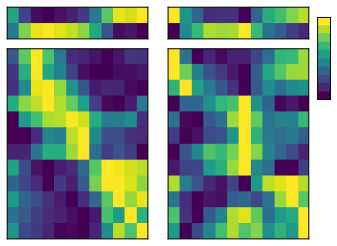

In [24]:
layout = fifi.FigureLayout('test_fig_layout.svg')
layout.make_mplfigures()

## yaw roll
curve_list = list()
name_list = list()
peak_list = list()

beh_curves = list()

for name,grp in tc_summary_22H05['yaw_roll'].items():
    if not(name in ['Ph0','Ph1','wb_frequency','Ph2','lpr']):
        if name in ['b2','hg1','hg2','hg3','hg4']:
            rect = tc_summary_39E01['yaw_roll'][name]['mn']
            rect -= np.min(rect)
        else:
            rect = grp['mn']-np.min(grp['mn'])
        curve_list.append(rect/np.max(rect))
        peak_list.append(np.argmax(rect/np.max(rect)))
        name_list.append(name)
    elif name in ['Ph1']:
        rect = grp['mn']-np.min(grp['mn'])
        beh_curves.append(rect/np.max(rect))
        beh_curves.append(rect/np.max(rect)*-1 + 1)
        
sorted_curves = sorted(zip(curve_list,name_list,peak_list),key = lambda x:x[2])
ax = layout.axes_groups['none']['yaw_roll']['muscles']
ax.imshow([x[0] for x in sorted_curves],cmap = plb.cm.viridis,aspect = 'auto')
ax.set_yticks(range(len(sorted_curves)))
lbs = ax.set_yticklabels([x[1] for x in sorted_curves])
ax.set_xticklabels([]);ax.set_xticks([])

ax = layout.axes_groups['none']['yaw_roll']['Ph1']
ax.imshow(beh_curves,cmap = plb.cm.viridis,aspect = 'auto')
ax.set_yticks(range(2))
lbs = ax.set_yticklabels(['right wing','-right wing'])
ax.set_xticklabels([]);ax.set_xticks([])
#ax.set_yticklabels([])

## pitch roll
curve_list = list()
name_list = list()
peak_list = list()

beh_curves = list()
for name,grp in tc_summary_22H05['pitch_roll'].items():
    if not(name in ['Ph0','Ph1','wb_frequency','Ph2','lpr']):
        if name in ['b2','hg1','hg2','hg3','hg4']:
            rect = tc_summary_39E01['pitch_roll'][name]['mn']
            rect -= np.min(rect)
        else:
            rect = grp['mn']-np.min(grp['mn'])  
        rect = grp['mn']-np.min(grp['mn'])
        curve_list.append(rect/np.max(rect))
        peak_list.append(np.argmax(rect/np.max(rect)))
        name_list.append(name)
    elif name in ['Ph1']:
        rect = grp['mn']-np.min(grp['mn'])
        beh_curves.append(rect/np.max(rect))
        beh_curves.append(rect/np.max(rect)*-1 + 1)

sorted_curves = sorted(zip(curve_list,name_list,peak_list),key = lambda x:x[2])
ax = layout.axes_groups['none']['pitch_roll']['muscles']
ax.imshow([x[0] for x in sorted_curves],cmap = plb.cm.viridis,aspect = 'auto')
ax.set_yticks(range(len(sorted_curves)))
lbs = ax.set_yticklabels([x[1] for x in sorted_curves])
ax.set_xticklabels([]);ax.set_xticks([])

ax = layout.axes_groups['none']['pitch_roll']['Ph1']
ax.imshow(beh_curves,cmap = plb.cm.viridis,aspect = 'auto')
ax.set_xticklabels([]);ax.set_xticks([])
ax.set_yticklabels([])

ax = layout.axes['cbar']
ax.imshow(np.array([np.linspace(0,1,10)[::-1]]).T,cmap = plb.cm.viridis,aspect = 'auto')
ax.set_xticklabels([]);ax.set_xticks([])
ax.set_yticklabels([]);ax.set_yticks([])

for ax in layout.axes.values():
    ax.set_xticklabels([]);ax.set_xticks([])
    ax.set_yticklabels([]);ax.set_yticks([])

layout.insert_figures()
layout.write_svg('test_fig.svg')
#lbls = ax.set_yticks(range(len(sorted_curves)))

# Time series examples

## Functions

In [25]:
def get_signal_data_22H05(signal):
    if signal == 'Sac':
        return sac_data
    elif signal in ['wb_frequency']:
        data_selection = np.array(mtd_22H05_pr['selected_signals'][signal])
        data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
        return data_selection
    elif signal in ['Ph0','Ph1','Ph2']:
        data_selection = np.array(mtd_22H05_pr['selected_signals'][signal])
        data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
        return data_selection
        #return np.array(mtd_22H05_pr['normed_signals'][signal])*np.array(
        #       mtd_22H05_pr['signal_norms'][signal])[:,None]
    elif signal in ['lpr']:
        lw = np.array(mtd_22H05_pr['selected_signals']['Ph0'])
        lw -= np.nanmean(lw[:,bsln],axis = 1)[:,None]
        rw = np.array(mtd_22H05_pr['selected_signals']['Ph1'])
        rw -= np.nanmean(rw[:,bsln],axis = 1)[:,None]
        return lw+rw
    else:
        return np.array(mtd_22H05_pr['normed_signals'][signal])
    
def get_signal_data_39E01(signal):
    if signal == 'Sac':
        return sac_data
    elif signal in ['wb_frequency']:
        data_selection = np.array(mtd_39E01_pr['selected_signals'][signal])
        data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
        return data_selection
    elif signal in ['Ph0','Ph1','Ph2']:
        data_selection = np.array(mtd_39E01_pr['selected_signals'][signal])
        data_selection -= np.nanmean(data_selection[:,bsln],axis = 1)[:,None]
        return data_selection
        #return np.array(mtd_39E01_pr['normed_signals'][signal])*np.array(
        #        mtd_39E01_pr['signal_norms'][signal])[:,None]
    elif signal in ['lpr']:
        lw = np.array(mtd_39E01_pr['selected_signals']['Ph0'])
        lw -= np.nanmean(lw[:,bsln],axis = 1)[:,None]
        rw = np.array(mtd_39E01_pr['selected_signals']['Ph1'])
        rw -= np.nanmean(rw[:,bsln],axis = 1)[:,None]
        return lw+rw
    else:
        return np.array(mtd_39E01_pr['normed_signals'][signal])

In [26]:
#these functions are for the time-series resampling
def sts(dta,fly_masks):
    ds = list()
    for rep in range(200):
    #for rep in range(10):
        sidx = np.random.choice(len(fly_masks),len(fly_masks),replace = True)
        ds.append(mom(dta,[fly_masks[i] for i in sidx]))
    ub = np.nanpercentile(ds,97.5,axis = 0)
    lb = np.nanpercentile(ds,2.25,axis = 0)
    mn = mom(dta,fly_masks)
    return {'ub':ub,'lb':lb,'mn':mn}

def mom(*sdata):
    fly_masks = sdata[1]
    dta = sdata[0]
    return np.nanmean([np.nanmean(dta[m,:],axis = 0) for m in fly_masks],axis = 0)
#plb.plot(mom(sdata))

##  Calculate stats

### 22H05

In [26]:
#select the fly masks
fly_masks = [np.array(mtd_22H05_pr['selected_signals']['fly_numbers']) == fn for fn in fly_numbers_22H05]
fly_trial_masks_22H05 = dict()
for trial_name in list(set(mtd_22H05_pr['selected_signals']['trial_names'])):
    trial_mask = np.array(mtd_22H05_pr['selected_signals']['trial_names']) == trial_name
    fly_trial_masks_22H05[trial_name] = [trial_mask & fly_mask for fly_mask in fly_masks]

#calculate the stat dictionary for GMR22H05
#stats_22H05 = dict()
signal_data = np.array(mtd_22H05_pr['selected_signals']['i1'])

skeys = mtd_22H05_pr['signal_means']
skeys = [k for k in skeys if not(k in ['Xpos','Ypos','StimCond'])]
skeys.append('lpr')

data_stats_22H05 = {}
for trial_key,tmasks in fly_trial_masks_22H05.items():
    #print trial_key
    data_stats_22H05[trial_key] = {}
    for skey in skeys:
        #print skey
        data_stats_22H05[trial_key][skey] = sts(get_signal_data_22H05(skey),tmasks)
import cPickle
with open('data_stats_22H05.cpkl','wb') as f:
    cPickle.dump(data_stats_22H05,f)

### 39E01

In [27]:
#select the fly masks
fly_masks = [np.array(mtd_39E01_pr['selected_signals']['fly_numbers']) == fn for fn in fly_numbers_39E01]
fly_trial_masks_39E01 = dict()
for trial_name in list(set(mtd_39E01_pr['selected_signals']['trial_names'])):
    trial_mask = np.array(mtd_39E01_pr['selected_signals']['trial_names']) == trial_name
    fly_trial_masks_39E01[trial_name] = [trial_mask & fly_mask for fly_mask in fly_masks]

#calculate the stat dictionary for GMR22H05
#stats_22H05 = dict()
signal_data = np.array(mtd_39E01_pr['selected_signals']['i1'])

skeys = mtd_39E01_pr['signal_means']
skeys = [k for k in skeys if not(k in ['Xpos','Ypos','StimCond'])]
skeys.append('lpr')

data_stats_39E01 = {}
for trial_key,tmasks in fly_trial_masks_39E01.items():
    #print trial_key
    data_stats_39E01[trial_key] = {}
    for skey in skeys:
        #print skey
        data_stats_39E01[trial_key][skey] = sts(get_signal_data_39E01(skey),tmasks)

import cPickle
with open('data_stats_39E01.cpkl','wb') as f:
    cPickle.dump(data_stats_39E01,f)

## Load stats

In [27]:
import cPickle
with open('data_stats_39E01.cpkl','rb') as f:
    data_stats_39E01 = cPickle.load(f)
with open('data_stats_22H05.cpkl','rb') as f:
    data_stats_22H05 = cPickle.load(f)

# Plot figure

In [40]:
reload(fifi)
layout = fifi.FigureLayout('figure_6_layout.svg')
layout.make_mplfigures()
layout.load_pathspecs()
import group_data as gd
xi = gd.get_xio('pth_roll_0')
tmask = (xi>-3) & (xi<10)

#############################
# Plot the example time series
#############################
for skey,group in layout.axes_groups['none'].items():
    if '-' in skey:
        skey = skey.split('-')[1]
        for tkey,ax in group.items():
            ub = data_stats_22H05[tkey][skey]['ub'];ub = gd.signal_plot_info[skey]['transform'](ub)
            lb = data_stats_22H05[tkey][skey]['lb'];lb = gd.signal_plot_info[skey]['transform'](lb)
            mn = data_stats_22H05[tkey][skey]['mn']
            mn = gd.signal_plot_info[skey]['transform'](mn)
            kwargs = layout.pathspecs['error_patch_tser'].mplkwargs()
            ax['axis'].fill_between(xi[tmask],ub[tmask],lb[tmask],clip_on = False,**kwargs)
            ax['axis'].plot(xi[tmask],mn[tmask],color = 'k',clip_on = False)
            plb.sca(ax['axis'])
            ax['axis'].set_ybound(y_bounds[skey])
            ax['axis'].set_xbound(-3,10)
            
for stimset in ['yaw_roll','pitch_roll',]:
    sum_ax = layout.axes_groups['none'][stimset]['behavior']
    sum_ax['axis'].plot(np.arange(-180,180,30),
                        np.nanmean(mns_22H05[stimset]['Ph1'],axis = 0),
                        color = 'r',clip_on = False)
    if stimset == 'pitch_roll':
        pass
        #sum_ax.plot(range(-180,180,30),pr_r)
        #sum_ax.plot(range(-180,180,30),pr_l)
    else:
        pass
        #sum_ax.plot(range(-180,180,30),yr_r)
        #sum_ax.plot(range(-180,180,30),yr_l)

#########################
# Plot the tuning curves
#########################

#behavior
    sum_ax = layout.axes_groups['none'][stimset]['behavior']
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['Ph0']['ub'],
                        tc_summary_22H05[stimset]['Ph0']['lb'],
                        clip_on= False,**layout.pathspecs['Ph0_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['Ph0']['mn'],
               clip_on = False,**layout.pathspecs['Ph0'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['Ph1']['ub'],
                        tc_summary_22H05[stimset]['Ph1']['lb'],
                       clip_on= False,**layout.pathspecs['Ph1_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['Ph1']['mn'],
               clip_on = False,**layout.pathspecs['Ph1'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['Ph2']['ub'],
                        tc_summary_22H05[stimset]['Ph2']['lb'],
                       clip_on= False,**layout.pathspecs['Ph2_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['Ph2']['mn'],
               clip_on = False,**layout.pathspecs['Ph2'].mplkwargs())
    
#basalars
    sum_ax = layout.axes_groups['none'][stimset]['basilars']
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['b1']['ub'],
                        tc_summary_22H05[stimset]['b1']['lb'],
                       clip_on = False,**layout.pathspecs['b1_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['b1']['mn'],
               clip_on = False,**layout.pathspecs['b1'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['b2']['ub'],
                        tc_summary_22H05[stimset]['b2']['lb'],
                       clip_on = False,**layout.pathspecs['b2_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['b2']['mn'],
               clip_on = False,**layout.pathspecs['b2'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['b3']['ub'],
                        tc_summary_22H05[stimset]['b3']['lb'],
                       clip_on = False,**layout.pathspecs['b3_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['b3']['mn'],
               clip_on = False,**layout.pathspecs['b3'].mplkwargs())
#ax1
    sum_ax = layout.axes_groups['none'][stimset]['ax1']
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['i1']['ub'],
                        tc_summary_22H05[stimset]['i1']['lb'],
                       clip_on = False,**layout.pathspecs['i1_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['i1']['mn'],
               clip_on = False,**layout.pathspecs['i1'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['i2']['ub'],
                        tc_summary_22H05[stimset]['i2']['lb'],
                       clip_on = False,**layout.pathspecs['i2_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['i2']['mn'],
               clip_on = False,**layout.pathspecs['i2'].mplkwargs())
#ax3
    sum_ax = layout.axes_groups['none'][stimset]['ax3']
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['iii1']['ub'],
                        tc_summary_22H05[stimset]['iii1']['lb'],
                       clip_on = False,**layout.pathspecs['iii1_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['iii1']['mn'],
               clip_on = False,**layout.pathspecs['iii1'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['iii3']['ub'],
                        tc_summary_22H05[stimset]['iii3']['lb'],
                       clip_on = False,**layout.pathspecs['iii3_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['iii3']['mn'],
               clip_on = False,**layout.pathspecs['iii3'].mplkwargs())
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['iii24']['ub'],
                        tc_summary_22H05[stimset]['iii24']['lb'],
                       clip_on = False,**layout.pathspecs['iii24_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['iii24']['mn'],
               clip_on = False,**layout.pathspecs['iii24'].mplkwargs())
    
    
#ax4
    sum_ax = layout.axes_groups['none'][stimset]['hg']
    
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['hg1']['ub'],
                        tc_summary_22H05[stimset]['hg1']['lb'],
                       clip_on = False,**layout.pathspecs['hg1_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['hg1']['mn'],
               clip_on = False,**layout.pathspecs['hg1'].mplkwargs())
                                                                                                                         
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['hg2']['ub'],
                        tc_summary_22H05[stimset]['hg2']['lb'],
                       clip_on = False,**layout.pathspecs['hg2_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['hg2']['mn'],
               clip_on = False,**layout.pathspecs['hg2'].mplkwargs())
                                                                        
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['hg3']['ub'],
                        tc_summary_22H05[stimset]['hg3']['lb'],
                       clip_on = False,**layout.pathspecs['hg3_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['hg3']['mn'],
               clip_on = False,**layout.pathspecs['hg3'].mplkwargs())
                                                            
    sum_ax.fill_between(np.arange(-180,180,30),
                        tc_summary_22H05[stimset]['hg4']['ub'],
                        tc_summary_22H05[stimset]['hg4']['lb'],
                       clip_on = False,**layout.pathspecs['hg4_er'].mplkwargs())
    sum_ax.plot(np.arange(-180,180,30),tc_summary_22H05[stimset]['hg4']['mn'],
               clip_on = False,**layout.pathspecs['hg4'].mplkwargs())
                                                                          
#################
# Set the bounds
#################
for stimset in ['pitch_roll','yaw_roll']:
    for ax in layout.axes_groups['none'][stimset].values():
        ax['axis'].set_xbound(-180,150)

def plot_polar_curve(ax,group,key,color,genotype = '22H05'):
    if genotype== '22H05':

        import copy as cp
        curve = tc_summary_22H05[group][key]['mn']
        curve = np.hstack((curve,curve[0]))
        phs = cp.copy(phases)
        phs.append(phs[0])

        ax.plot(phs,(curve-np.min(curve))/(np.max(curve)-np.min(curve)),
                clip_on = False,**layout.pathspecs[key].mplkwargs())

        from scipy.stats import circmean,circvar
        mn = circmean(np.array(phases_22H05[group][key]))
        kwargs = layout.pathspecs['%s_er'%(key)].mplkwargs()
        kwargs = layout.pathspecs[key].mplkwargs()
        cl = kwargs['color']
        ax.scatter(mn,1.2,20.0,marker = 'o',clip_on = False,c = cl,edgecolor = 'none')
        ax.set_ybound(0,1.0)
        
    elif genotype== '39E01':
        
        import copy as cp
        curve = tc_summary_39E01[group][key]['mn']
        curve = np.hstack((curve,curve[0]))
        phs = cp.copy(phases)
        phs.append(phs[0])
        
        ax.plot(phs,(curve-np.min(curve))/(np.max(curve)-np.min(curve)),
                clip_on = False,**layout.pathspecs[key].mplkwargs())
        
        from scipy.stats import circmean,circvar
        mn = circmean(np.array(phases_39E01[group][key]))
        kwargs = layout.pathspecs['%s_er'%(key)].mplkwargs()
        kwargs = layout.pathspecs[key].mplkwargs()
        cl = kwargs['color']
        ax.scatter(mn,1.2,20.0,marker = 'o',clip_on = False,c = cl,edgecolor = 'none')
        ax.set_ybound(0,1.0)
        
###############
# Plot the polar curves
###############

## 22H05
group = 'pitch_roll'
key = 'Ph1'
ax = layout.axes_groups['none']['polar_pr_22H05']['behavior']['axis']
for key,c in zip(['Ph0','Ph1','Ph2'],['b','c','g']):
    plot_polar_curve(ax,group,key,c,genotype = '22H05')

ax = layout.axes_groups['none']['polar_pr_22H05']['basalars']['axis']
for key,c in zip(['b1','b3'],['b','g']):
    plot_polar_curve(ax,group,key,c)
### genotype repacement
for key,c in zip(['b2'],['c']):
    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
ax = layout.axes_groups['none']['polar_pr_22H05']['ax1']['axis']
for key,c in zip(['i1','i2',],['b','c']):
    plot_polar_curve(ax,group,key,c)
ax = layout.axes_groups['none']['polar_pr_22H05']['ax3']['axis']
for key,c in zip(['iii1','iii3','iii24'],['b','c','g']):
    plot_polar_curve(ax,group,key,c)
    
ax = layout.axes_groups['none']['polar_pr_22H05']['hg']['axis']
for key,c in zip(['hg1','hg2','hg3','hg4'],['b','c','g','y']):
    plot_polar_curve(ax,group,key,c,genotype = '39E01')

## 39E01
#group = 'pitch_roll'
#ax = layout.axes_groups['none']['polar_pr_39E01']['behavior']['axis']
#for key,c in zip(['Ph0','Ph1','Ph2'],['b','c','g']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')

#ax = layout.axes_groups['none']['polar_pr_39E01']['basalars']['axis']
#for key,c in zip(['b1','b2','b3'],['b','c','g']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')

#ax = layout.axes_groups['none']['polar_pr_39E01']['ax3']['axis']
#for key,c in zip(['iii1','iii3'],['b','c']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
#ax = layout.axes_groups['none']['polar_pr_39E01']['hg']['axis']
#for key,c in zip(['hg1','hg2','hg3','hg4'],['b','c','g','y']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
###############
###############
## 22H05
group = 'yaw_roll'
#key = 'Ph1'
ax = layout.axes_groups['none']['polar_yr_22H05']['behavior']['axis']
for key,c in zip(['Ph0','Ph1','Ph2'],['b','c','g']):
    plot_polar_curve(ax,group,key,c,genotype = '22H05')
    
#ax = layout.axes_groups['polar_yr_22H05']['behavior']['axis']
#plot_polar_curve(ax,group,key,'r')

ax = layout.axes_groups['none']['polar_yr_22H05']['basalars']['axis']
for key,c in zip(['b1','b3'],['b','g']):
    plot_polar_curve(ax,group,key,c)
### genotype repacement
for key,c in zip(['b2'],['c']):
    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
ax = layout.axes_groups['none']['polar_yr_22H05']['ax1']['axis']
for key,c in zip(['i1','i2',],['b','c']):
    plot_polar_curve(ax,group,key,c)

ax = layout.axes_groups['none']['polar_yr_22H05']['ax3']['axis']
for key,c in zip(['iii1','iii3','iii24'],['b','c','g']):
    plot_polar_curve(ax,group,key,c)

### geneotype replacement
ax = layout.axes_groups['none']['polar_yr_22H05']['hg']['axis']
for key,c in zip(['hg1','hg2','hg3','hg4'],['b','c','g','y']):
    plot_polar_curve(ax,group,key,c,genotype = '39E01')

## 39E01
#group = 'yaw_roll'
#ax = layout.axes_groups['none']['polar_yr_39E01']['behavior']['axis']
#for key,c in zip(['Ph0','Ph1','Ph2'],['b','c','g']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
#ax = layout.axes_groups['polar_yr_22H05']['behavior']['axis']
#plot_polar_curve(ax,group,key,'r')

#ax = layout.axes_groups['none']['polar_yr_39E01']['basalars']['axis']
#for key,c in zip(['b1','b2','b3'],['b','c','g']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
#ax = layout.axes_groups['polar_yr_39E01']['ax1']['axis']
#for key,c in zip(['i1','i2',],['b','c']):
#    plot_polar_curve(ax,group,key,c)

#ax = layout.axes_groups['none']['polar_yr_39E01']['ax3']['axis']
#for key,c in zip(['iii1','iii3',],['b','c']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
#ax = layout.axes_groups['none']['polar_yr_39E01']['hg']['axis']
#for key,c in zip(['hg1','hg2','hg3','hg4'],['b','c','g','y']):
#    plot_polar_curve(ax,group,key,c,genotype = '39E01')
    
    
layout.apply_mpl_methods()

for axkey,ax in layout.axes.items():
    if 'axvspans' in axkey[0]:
        kwargs = layout.pathspecs['epoch_patch'].mplkwargs()
        ax['axis'].axvspan(0,3,**kwargs)
        #ax['axis'].axvline(0,color = 'k',ls = (0,(0.1,1.0)))
        #ax['axis'].axvline(3,color = 'k',ls = (0,(0.1,1.0)))
        ax['axis'].set_xbound(-3,10)
    plb.sca(ax['axis'])
    plf.kill_spines()

layout.insert_figures('mpl_panel_a')
layout.set_layer_visibility('Layer 1',False)
layout.set_layer_visibility('mpl_panel_a',True)
layout.set_layer_visibility('labels',True)
layout.set_layer_visibility('bk_shade',True)
layout.write_svg('figure_6.svg')
plb.close()
from IPython.display import display,SVG
display(SVG('figure_6.svg'))

# plot supplementary figure 

In [78]:
reload(fifi)
reload(gd)
layout = fifi.FigureLayout('figure_s4_layout.svg')
layout.make_mplfigures()
layout.load_pathspecs()

for skey,group in layout.axes_groups['none'].items():
    if '-' in skey:
        skey = skey.split('-')[1]
        for tkey,ax in group.items():
            if skey == 'sac':
                #pass
                sdata = get_sac_hist(tkey)
                slct = (sdata['x']>-3) & (sdata['x']<9)
                ax.plot(sdata['x'][slct],sdata['l'][slct],'-o',ms = 2.0,markeredgewidth = 0,color = 'b',)
                ax.plot(sdata['x'][slct],sdata['r'][slct],'-o',ms = 2.0,markeredgewidth = 0,color = 'g')
                ax.set_ybound(y_bounds[skey])
                ax.set_xbound(-3,10)
            else:
                try:
                    
                    ub = data_stats_22H05[tkey][skey]['ub'];ub = gd.signal_plot_info[skey]['transform'](ub)
                    lb = data_stats_22H05[tkey][skey]['lb'];lb = gd.signal_plot_info[skey]['transform'](lb)
                    mn = data_stats_22H05[tkey][skey]['mn']
                    mn = gd.signal_plot_info[skey]['transform'](mn)
                    
                    kwargs = layout.pathspecs['error_patch_22H05'].mplkwargs()
                    ax['axis'].fill_between(xi[tmask][::10],
                                            ub[tmask][::10],
                                            lb[tmask][::10],
                                            clip_on = False,**kwargs)
                    kwargs = layout.pathspecs['mn_22H05'].mplkwargs()
                    ax['axis'].plot(xi[tmask],
                                    mn[tmask],
                                    clip_on = False,**kwargs)
                    
                except KeyError as kr:
                    print kr
                try:
                    ub = data_stats_39E01[tkey][skey]['ub'];ub = gd.signal_plot_info[skey]['transform'](ub)
                    lb = data_stats_39E01[tkey][skey]['lb'];lb = gd.signal_plot_info[skey]['transform'](lb)
                    mn = data_stats_39E01[tkey][skey]['mn']
                    mn = gd.signal_plot_info[skey]['transform'](mn)
                    
                    kwargs = layout.pathspecs['error_patch_39E01'].mplkwargs()
                    ax['axis'].fill_between(xi[tmask][::10],
                                            ub[tmask][::10],
                                            lb[tmask][::10],
                                            clip_on = False,**kwargs)
                    kwargs = layout.pathspecs['mn_39E01'].mplkwargs()
                    ax['axis'].plot(xi[tmask][::10],
                                    mn[tmask][::10],
                                    clip_on = False,**kwargs)
                except KeyError as kr:
                    print kr
                    
                ax.set_ybound(y_bounds[skey])
                ax.set_xbound(-3,10)

            
for group_key,group in layout.axes_groups['none'].items():
    if 'axvspan' in group_key:
        for ax in group.values():
            
            #ax.axvline(0,color = 'k',ls = (0,(0.1,1.0)))
            #ax.axvline(3,color = 'k',ls = (0,(0.1,1.0)))
            kwargs = layout.pathspecs['epoch_patch'].mplkwargs()
            ax.axvspan(0,3, **kwargs)
            ax.set_xbound(-3,10)
            
for ax in layout.axes.values():
    plb.sca(ax['axis'])
    plf.kill_spines()
    
layout.insert_figures('mpl_panel_a')
layout.set_layer_visibility('Layer 1',False)
layout.write_svg('figure_s4.svg')
plb.close()
from IPython.display import display,SVG
display(SVG('figure_s4.svg'))

In [74]:
layout.axes_groups['none']['step_roll_yaw-sac'].keys()
layout.axes_groups['none']['pth_roll-sac'].keys()

[u'pth_roll_300',
 u'pth_roll_120',
 u'pth_roll_330',
 u'pth_roll_210',
 u'pth_roll_30',
 u'pth_roll_60',
 u'pth_roll_150',
 u'pth_roll_0',
 u'pth_roll_90',
 u'pth_roll_180',
 u'pth_roll_270',
 u'pth_roll_240']

In [72]:
layout.axes_groups['none'].keys()

[u'axvspan_yr_ca',
 u'step_roll_yaw-iii3',
 u'step_roll_yaw-iii1',
 u'pth_roll-b2',
 u'pth_roll-b3',
 u'pth_roll-b1',
 u'step_roll_yaw-i2',
 u'step_roll_yaw-i1',
 u'step_roll_yaw-hg3',
 u'step_roll_yaw-hg2',
 u'step_roll_yaw-hg1',
 u'pth_roll-wb_frequency',
 u'step_roll_yaw-b3',
 u'step_roll_yaw-b2',
 u'step_roll_yaw-b1',
 u'axvspan_pr_ca',
 u'axvspan_yr_b',
 u'pth_roll-Ph1',
 u'pth_roll-Ph0',
 u'pth_roll-hg3',
 u'pth_roll-i2',
 u'pth_roll-i1',
 u'step_roll_yaw-wb_frequency',
 u'step_roll_yaw-sac',
 u'pth_roll-iii24',
 u'pth_roll-hg4',
 u'axvspan_pr_b',
 u'pth_roll-hg1',
 u'pth_roll-hg2',
 u'pth_roll-lpr',
 u'pth_roll-Ph2',
 u'pth_roll-sac',
 u'step_roll_yaw-lpr',
 u'step_roll_yaw-iii24',
 u'step_roll_yaw-hg4',
 u'pth_roll-iii3',
 u'pth_roll-iii1',
 u'step_roll_yaw-Ph2',
 u'step_roll_yaw-Ph0',
 u'step_roll_yaw-Ph1']

# Variable inspector

In [50]:
#inspector = VariableInspectorWindow(get_ipython())
inspector

In [16]:
from IPython.html import widgets # Loads the Widget framework.
from IPython.core.magics.namespace import NamespaceMagics # Used to query namespace.

# For this example, hide these names, just to avoid polluting the namespace further
get_ipython().user_ns_hidden['widgets'] = widgets
get_ipython().user_ns_hidden['NamespaceMagics'] = NamespaceMagics

In [47]:
class VariableInspectorWindow(object):
    instance = None
    
    def __init__(self, ipython):
        """Public constructor."""
        if VariableInspectorWindow.instance is not None:
            raise Exception("""Only one instance of the Variable Inspector can exist at a 
                time.  Call close() on the active instance before creating a new instance.
                If you have lost the handle to the active instance, you can re-obtain it
                via `VariableInspectorWindow.instance`.""")
        
        VariableInspectorWindow.instance = self
        self.closed = False
        self.namespace = NamespaceMagics()
        self.namespace.shell = ipython.kernel.shell
        
        self._box = widgets.Box()
        self._box._dom_classes = ['inspector']
        self._box.background_color = '#fff'
        self._box.border_color = '#ccc'
        self._box.border_width = 1
        self._box.border_radius = 5

        self._modal_body = widgets.VBox()
        self._modal_body.overflow_y = 'scroll'

        self._modal_body_label = widgets.HTML(value = 'Not hooked')
        self._modal_body.children = [self._modal_body_label]

        self._box.children = [
            self._modal_body, 
        ]
        
        self._ipython = ipython
        self._ipython.events.register('post_run_cell', self._fill)
        
    def close(self):
        """Close and remove hooks."""
        if not self.closed:
            self._ipython.events.unregister('post_run_cell', self._fill)
            self._box.close()
            self.closed = True
            VariableInspectorWindow.instance = None

    def _fill(self):
        """Fill self with variable information."""
        values = self.namespace.who_ls()
        self._modal_body_label.value = '<table class="table table-bordered table-striped"><tr><th>Name</th><th>Type</th><th>Value</th></tr><tr><td>' + \
            '</td></tr><tr><td>'.join(['{0}</td><td>{1}</td><td>{2}'.format(v, type(eval(v)).__name__, str(eval(v))) for v in values]) + \
            '</td></tr></table>'

    def _ipython_display_(self):
        """Called when display() or pyout is used to display the Variable 
        Inspector."""
        self._box._ipython_display_()

In [46]:
widgets.DOMWidget?